In [4]:
import pandas as pd
from ucimlrepo import fetch_ucirepo
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px
import seaborn as sns
import plotly.subplots as sp
import plotly.graph_objects as go
import numpy as np
import scipy.stats as stats
import os
import requests
from io import StringIO
from geopy.geocoders import Nominatim
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from IPython.display import display, Math
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.mixture import GaussianMixture
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, classification_report, precision_score, recall_score, f1_score
from sklearn.metrics import precision_recall_fscore_support
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from mlxtend.frequent_patterns import apriori, association_rules

In [5]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Data Set

In [9]:
dataset = fetch_ucirepo(id=373)

# Convert to DataFrame
df_features = dataset.data.features
df_target = dataset.data.targets 

In [11]:
df_features

,age,gender,education,country,ethnicity,nscore,escore,oscore,ascore,cscore,impuslive,ss
0,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,-0.21712,-1.18084
1,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,-0.71126,-0.21575
2,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,-1.37983,0.40148
3,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,0.58489,-1.37983,-1.18084
4,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,1.30612,-0.21712,-0.21575
...,...,...,...,...,...,...,...,...,...,...,...,...
1880,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,-1.19430,1.74091,1.88511,0.76096,-1.13788,0.88113,1.92173
1881,-0.95197,-0.48246,-0.61113,-0.57009,-0.31685,-0.24649,1.74091,0.58331,0.76096,-1.51840,0.88113,0.76540
1882,-0.07854,0.48246,0.45468,-0.57009,-0.31685,1.13281,-1.37639,-1.27553,-1.77200,-1.38502,0.52975,-0.52593
1883,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,0.91093,-1.92173,0.29338,-1.62090,-2.57309,1.29221,1.22470


In [13]:
df_target

,alcohol,amphet,amyl,benzos,caff,cannabis,choc,coke,crack,ecstasy,heroin,ketamine,legalh,lsd,meth,mushrooms,nicotine,semer,vsa
0,CL5,CL2,CL0,CL2,CL6,CL0,CL5,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL2,CL0,CL0
1,CL5,CL2,CL2,CL0,CL6,CL4,CL6,CL3,CL0,CL4,CL0,CL2,CL0,CL2,CL3,CL0,CL4,CL0,CL0
2,CL6,CL0,CL0,CL0,CL6,CL3,CL4,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL1,CL0,CL0,CL0
3,CL4,CL0,CL0,CL3,CL5,CL2,CL4,CL2,CL0,CL0,CL0,CL2,CL0,CL0,CL0,CL0,CL2,CL0,CL0
4,CL4,CL1,CL1,CL0,CL6,CL3,CL6,CL0,CL0,CL1,CL0,CL0,CL1,CL0,CL0,CL2,CL2,CL0,CL0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1880,CL5,CL0,CL0,CL0,CL4,CL5,CL4,CL0,CL0,CL0,CL0,CL0,CL3,CL3,CL0,CL0,CL0,CL0,CL5
1881,CL5,CL0,CL0,CL0,CL5,CL3,CL4,CL0,CL0,CL2,CL0,CL0,CL3,CL5,CL4,CL4,CL5,CL0,CL0
1882,CL4,CL6,CL5,CL5,CL6,CL6,CL6,CL4,CL0,CL4,CL0,CL2,CL0,CL2,CL0,CL2,CL6,CL0,CL0
1883,CL5,CL0,CL0,CL0,CL6,CL6,CL5,CL0,CL0,CL3,CL0,CL0,CL3,CL3,CL0,CL3,CL4,CL0,CL0


In [15]:
df_target.columns

Index(['alcohol', 'amphet', 'amyl', 'benzos', 'caff', 'cannabis', 'choc',
       'coke', 'crack', 'ecstasy', 'heroin', 'ketamine', 'legalh', 'lsd',
       'meth', 'mushrooms', 'nicotine', 'semer', 'vsa'],
      dtype='object')

In [17]:
df_features.columns

Index(['age', 'gender', 'education', 'country', 'ethnicity', 'nscore',
       'escore', 'oscore', 'ascore', 'cscore', 'impuslive', 'ss'],
      dtype='object')

In [19]:
print(df_features.isnull().sum())

age          0
gender       0
education    0
country      0
ethnicity    0
nscore       0
escore       0
oscore       0
ascore       0
cscore       0
impuslive    0
ss           0
dtype: int64


In [21]:
print(df_target.isnull().sum())

alcohol      0
amphet       0
amyl         0
benzos       0
caff         0
cannabis     0
choc         0
coke         0
crack        0
ecstasy      0
heroin       0
ketamine     0
legalh       0
lsd          0
meth         0
mushrooms    0
nicotine     0
semer        0
vsa          0
dtype: int64


In [23]:
df_target.describe()

,alcohol,amphet,amyl,benzos,caff,cannabis,choc,coke,crack,ecstasy,heroin,ketamine,legalh,lsd,meth,mushrooms,nicotine,semer,vsa
count,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885
unique,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,5,7
top,CL5,CL0,CL0,CL0,CL6,CL6,CL6,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL6,CL0,CL0
freq,759,976,1305,1000,1385,463,807,1038,1627,1021,1605,1490,1094,1069,1429,982,610,1877,1455


In [25]:
df_features.describe()

,age,gender,education,country,ethnicity,nscore,escore,oscore,ascore,cscore,impuslive,ss
count,1885.00000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000
mean,0.03461,-0.000256,-0.003806,0.355542,-0.309577,0.000047,-0.000163,-0.000534,-0.000245,-0.000386,0.007216,-0.003292
std,0.87836,0.482588,0.950078,0.700335,0.166226,0.998106,0.997448,0.996229,0.997440,0.997523,0.954435,0.963701
min,-0.95197,-0.482460,-2.435910,-0.570090,-1.107020,-3.464360,-3.273930,-3.273930,-3.464360,-3.464360,-2.555240,-2.078480
25%,-0.95197,-0.482460,-0.611130,-0.570090,-0.316850,-0.678250,-0.695090,-0.717270,-0.606330,-0.652530,-0.711260,-0.525930
50%,-0.07854,-0.482460,-0.059210,0.960820,-0.316850,0.042570,0.003320,-0.019280,-0.017290,-0.006650,-0.217120,0.079870
75%,0.49788,0.482460,0.454680,0.960820,-0.316850,0.629670,0.637790,0.723300,0.760960,0.584890,0.529750,0.765400
max,2.59171,0.482460,1.984370,0.960820,1.907250,3.273930,3.273930,2.901610,3.464360,3.464360,2.901610,1.921730


In [27]:
df = pd.concat([df_features, df_target], axis=1)

In [29]:
df.head()

,age,gender,education,country,ethnicity,nscore,escore,oscore,ascore,cscore,...,ecstasy,heroin,ketamine,legalh,lsd,meth,mushrooms,nicotine,semer,vsa
0,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,...,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL2,CL0,CL0
1,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,...,CL4,CL0,CL2,CL0,CL2,CL3,CL0,CL4,CL0,CL0
2,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,...,CL0,CL0,CL0,CL0,CL0,CL0,CL1,CL0,CL0,CL0
3,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,0.58489,...,CL0,CL0,CL2,CL0,CL0,CL0,CL0,CL2,CL0,CL0
4,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,1.30612,...,CL1,CL0,CL0,CL1,CL0,CL0,CL2,CL2,CL0,CL0


# EDA

In [119]:
def extract_cat_num(df):
    cat_col=[col for col in df.columns if df[col].dtype=='object']
    num_col=[col for col in df.columns if df[col].dtype!='object']
    return cat_col,num_col

In [121]:
cat_col,num_cols=extract_cat_num(df)

In [123]:
for col in cat_col:
    print('{} has {} values '.format(col,df[col].unique()))
    print('\n')

alcohol has ['CL5' 'CL6' 'CL4' 'CL2' 'CL1' 'CL0' 'CL3'] values 


amphet has ['CL2' 'CL0' 'CL1' 'CL3' 'CL5' 'CL4' 'CL6'] values 


amyl has ['CL0' 'CL2' 'CL1' 'CL3' 'CL5' 'CL4' 'CL6'] values 


benzos has ['CL2' 'CL0' 'CL3' 'CL1' 'CL4' 'CL5' 'CL6'] values 


caff has ['CL6' 'CL5' 'CL4' 'CL3' 'CL0' 'CL1' 'CL2'] values 


cannabis has ['CL0' 'CL4' 'CL3' 'CL2' 'CL1' 'CL6' 'CL5'] values 


choc has ['CL5' 'CL6' 'CL4' 'CL0' 'CL3' 'CL2' 'CL1'] values 


coke has ['CL0' 'CL3' 'CL2' 'CL1' 'CL6' 'CL5' 'CL4'] values 


crack has ['CL0' 'CL1' 'CL2' 'CL3' 'CL5' 'CL4' 'CL6'] values 


ecstasy has ['CL0' 'CL4' 'CL1' 'CL3' 'CL2' 'CL6' 'CL5'] values 


heroin has ['CL0' 'CL1' 'CL2' 'CL3' 'CL5' 'CL6' 'CL4'] values 


ketamine has ['CL0' 'CL2' 'CL3' 'CL1' 'CL5' 'CL4' 'CL6'] values 


legalh has ['CL0' 'CL1' 'CL2' 'CL3' 'CL5' 'CL4' 'CL6'] values 


lsd has ['CL0' 'CL2' 'CL1' 'CL3' 'CL4' 'CL5' 'CL6'] values 


meth has ['CL0' 'CL3' 'CL1' 'CL6' 'CL4' 'CL2' 'CL5'] values 


mushrooms has ['CL0' 'CL1' 'CL2' 

All the targets above are substances except Semer which is a control group

- CL0: Never used
- CL1: Tried once or twice
- CL2: Occasional use
- CL3: Moderate use
- CL4: Frequent use
- CL5: Heavy use
- CL6: Very heavy use / addiction

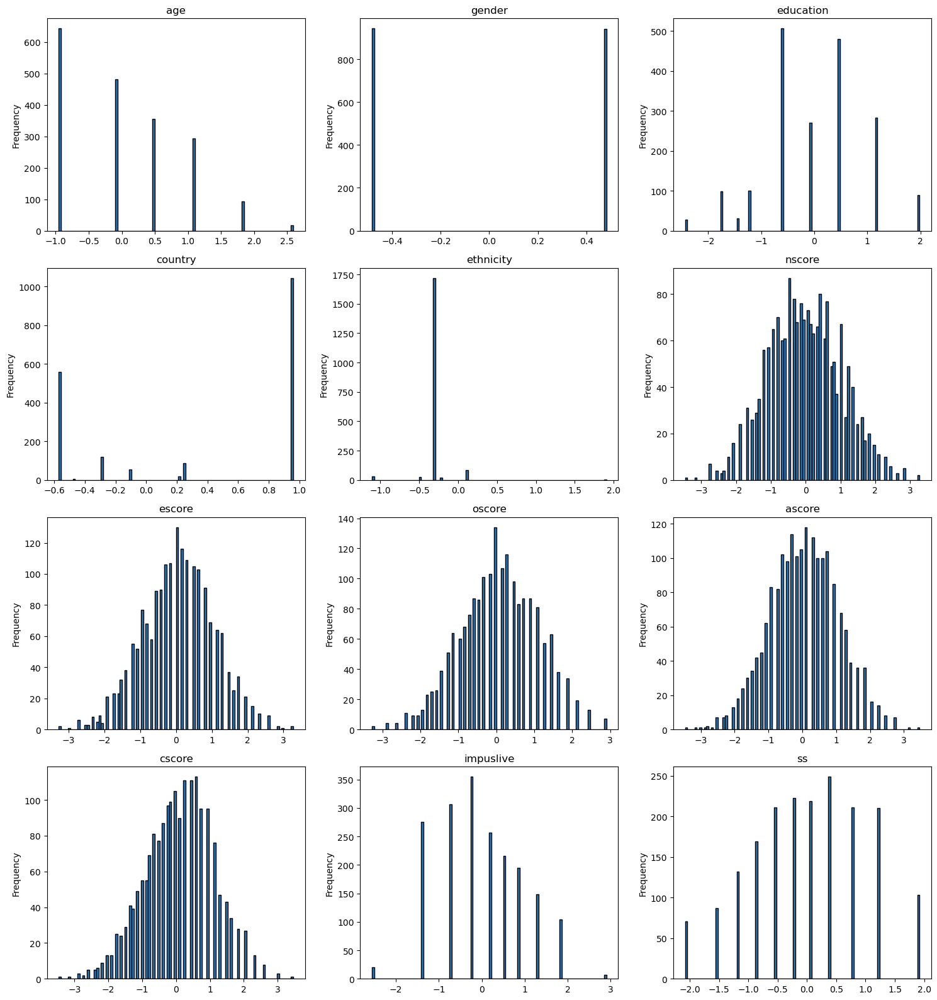

In [127]:
numeric_vars = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
numeric_vars = [col for col in numeric_vars if col not in ['ID']]
num_vars_to_plot = min(len(numeric_vars), 23)
num_cols = 3 
num_rows = (num_vars_to_plot // num_cols) + (num_vars_to_plot % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 4))
axes = axes.flatten()
for i, col in enumerate(numeric_vars[:num_vars_to_plot]):
    axes[i].hist(df[col].dropna(), bins=100, edgecolor='black')
    axes[i].set_title(col)
    axes[i].set_ylabel("Frequency")
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

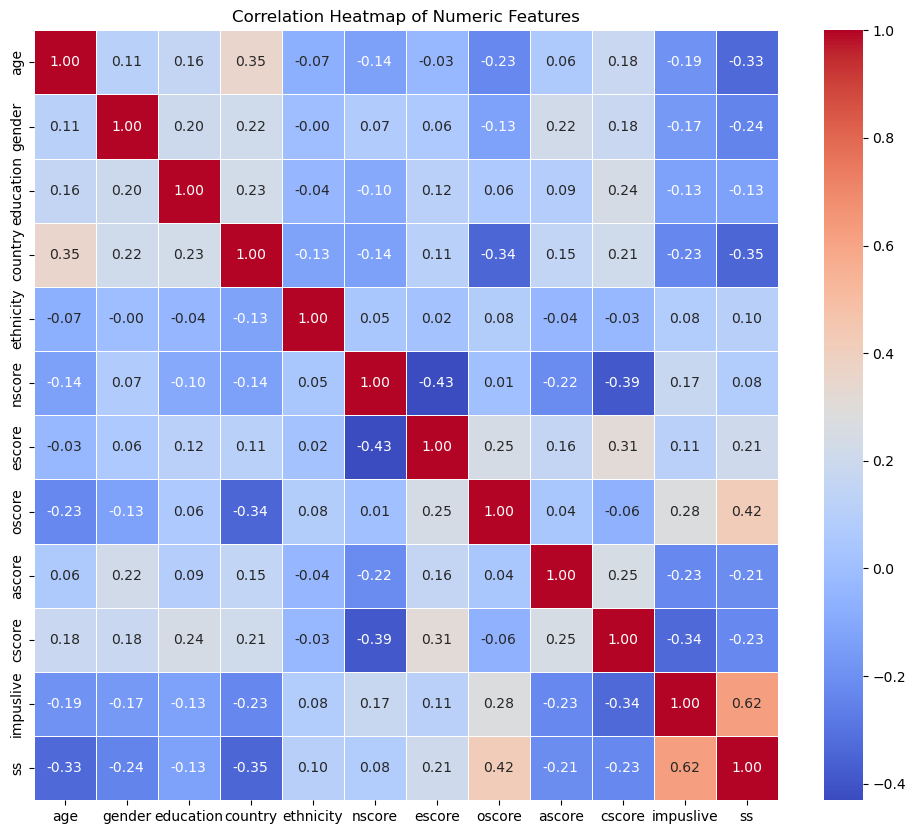

In [129]:
numeric_vars = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
numeric_vars = [col for col in numeric_vars if col != 'ID']
correlation_matrix = df[numeric_vars].corr(method='pearson')
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap of Numeric Features")
plt.show()


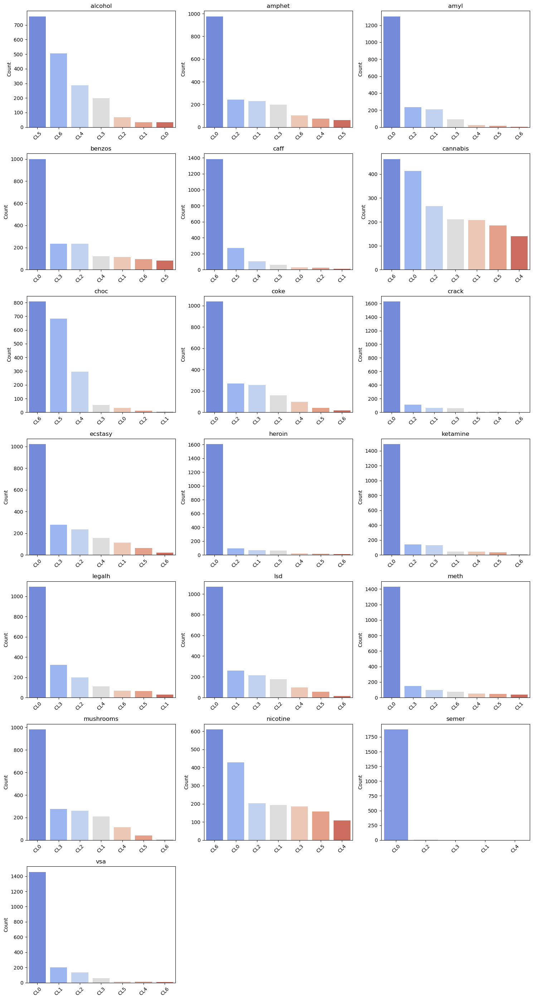

In [135]:
cat_vars = df.select_dtypes(include=['object']).columns.tolist()
num_vars_to_plot = min(len(cat_vars), 23)

num_cols = 3
num_rows = (num_vars_to_plot // num_cols) + (num_vars_to_plot % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 4))
axes = axes.flatten()

for i, col in enumerate(cat_vars[:num_vars_to_plot]):
    sns.countplot(x=df[col], order=df[col].value_counts().index, ax=axes[i], palette="coolwarm")
    axes[i].set_title(col)
    axes[i].set_xlabel("")
    axes[i].set_ylabel("Count")
    axes[i].tick_params(axis='x', rotation=45)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [182]:
trait_scores = ['nscore', 'escore', 'oscore', 'ascore', 'cscore', 'impuslive', 'ss'] 

# Violin plot Drug uses persanality traits vs scores

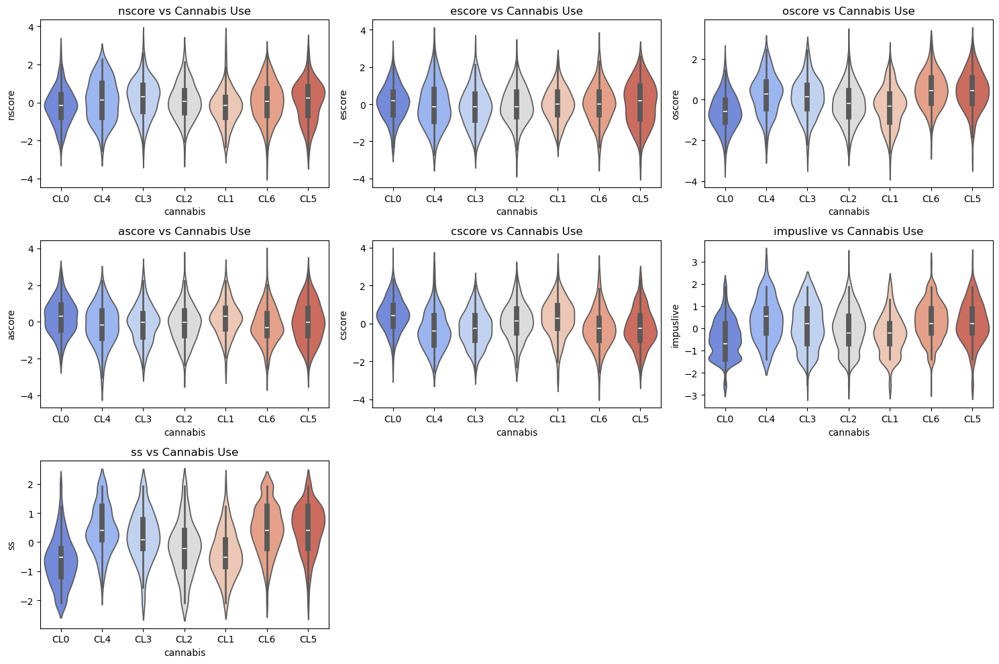

In [252]:
plt.figure(figsize=(15, 10))
num_vars = len(trait_scores)
num_cols = 3
num_rows = 3

for i, feature in enumerate(trait_scores):
    plt.subplot(num_rows, num_cols, i + 1) 
    sns.violinplot(x=df["cannabis"], y=df[feature], palette="coolwarm")
    plt.title(f"{feature} vs Cannabis Use")

plt.tight_layout()
plt.show()

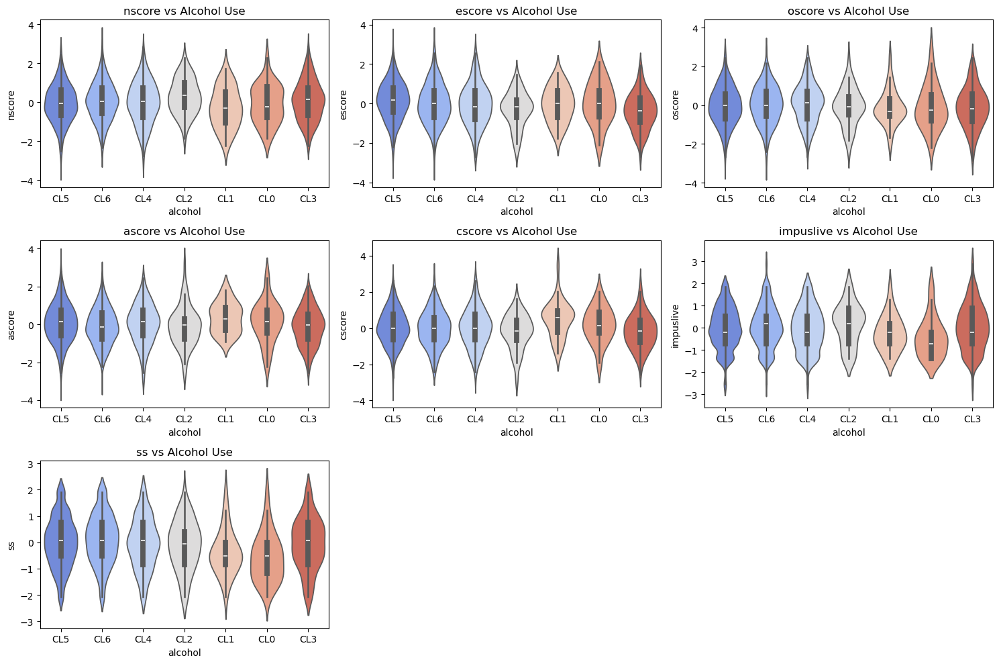

In [254]:
plt.figure(figsize=(15, 10))
num_vars = len(trait_scores)
num_cols = 3
num_rows = 3

for i, feature in enumerate(trait_scores):
    plt.subplot(num_rows, num_cols, i + 1) 
    sns.violinplot(x=df['alcohol'], y=df[feature], palette="coolwarm")
    plt.title(f"{feature} vs Alcohol Use")

plt.tight_layout()
plt.show()

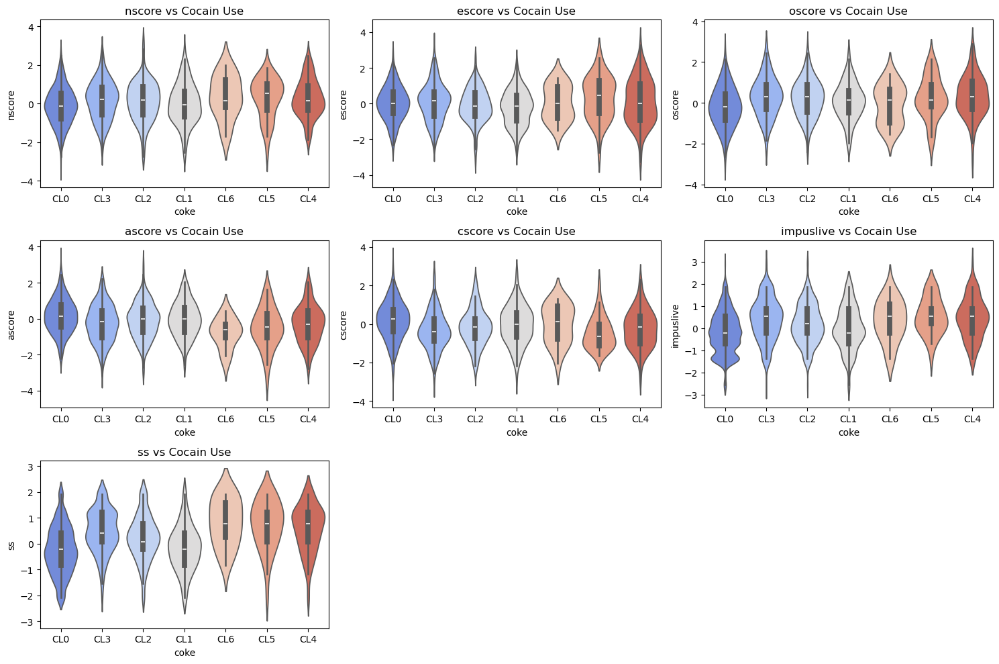

In [256]:
plt.figure(figsize=(15, 10))
num_vars = len(trait_scores)
num_cols = 3
num_rows = 3

for i, feature in enumerate(trait_scores):
    plt.subplot(num_rows, num_cols, i + 1)  
    sns.violinplot(x=df['coke'], y=df[feature], palette="coolwarm")
    plt.title(f"{feature} vs Cocain Use")

plt.tight_layout()
plt.show()

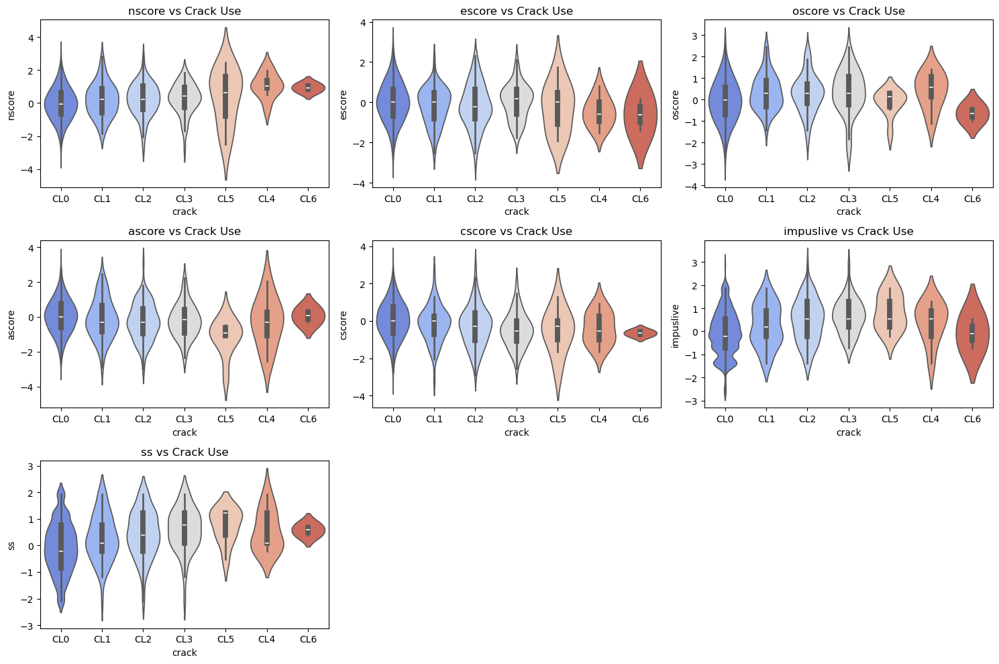

In [258]:
plt.figure(figsize=(15, 10))
num_vars = len(trait_scores)
num_cols = 3
num_rows = 3

for i, feature in enumerate(trait_scores):
    plt.subplot(num_rows, num_cols, i + 1)  
    sns.violinplot(x=df['crack'], y=df[feature], palette="coolwarm")
    plt.title(f"{feature} vs Crack Use")

plt.tight_layout()
plt.show()

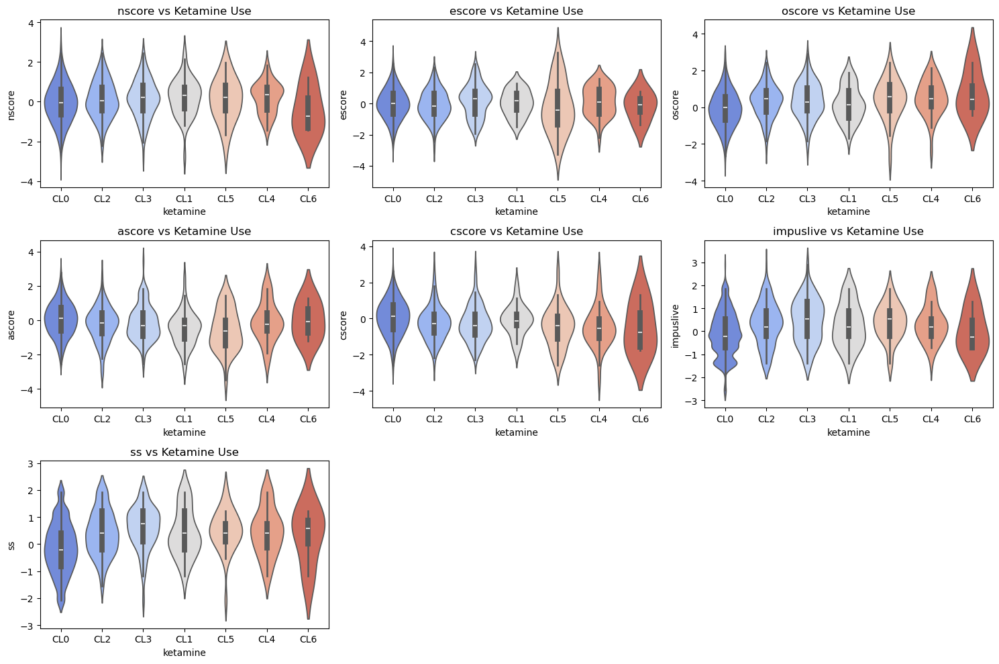

In [260]:
plt.figure(figsize=(15, 10))
num_vars = len(trait_scores)
num_cols = 3
num_rows = 3

for i, feature in enumerate(trait_scores):
    plt.subplot(num_rows, num_cols, i + 1)  
    sns.violinplot(x=df['ketamine'], y=df[feature], palette="coolwarm")
    plt.title(f"{feature} vs Ketamine Use")

plt.tight_layout()
plt.show()

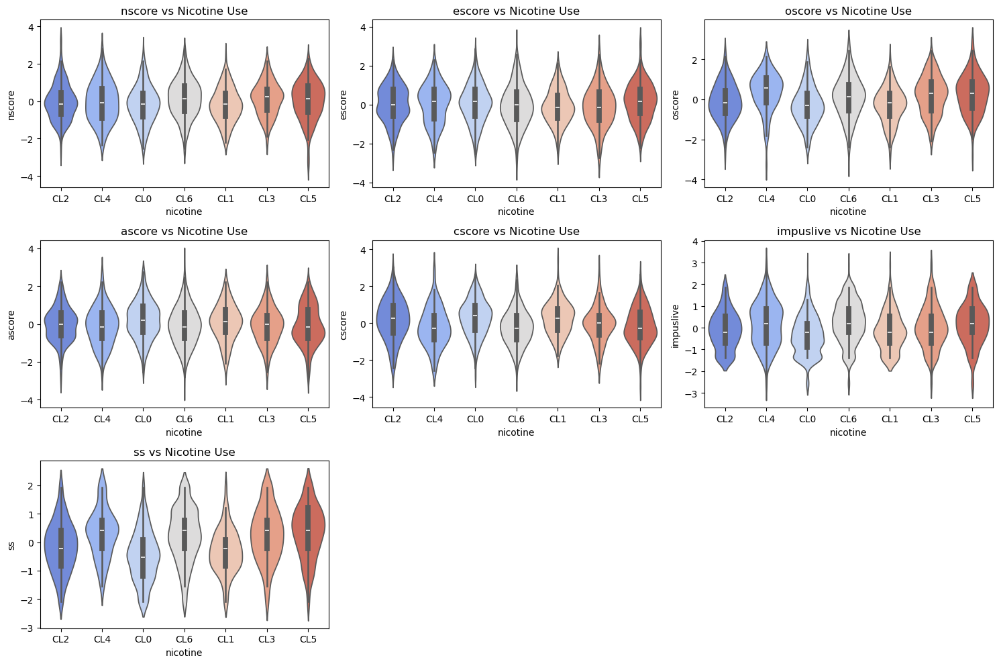

In [262]:
plt.figure(figsize=(15, 10))
num_vars = len(trait_scores)
num_cols = 3
num_rows = 3

for i, feature in enumerate(trait_scores):
    plt.subplot(num_rows, num_cols, i + 1)  
    sns.violinplot(x=df['nicotine'], y=df[feature], palette="coolwarm")
    plt.title(f"{feature} vs Nicotine Use")

plt.tight_layout()
plt.show()

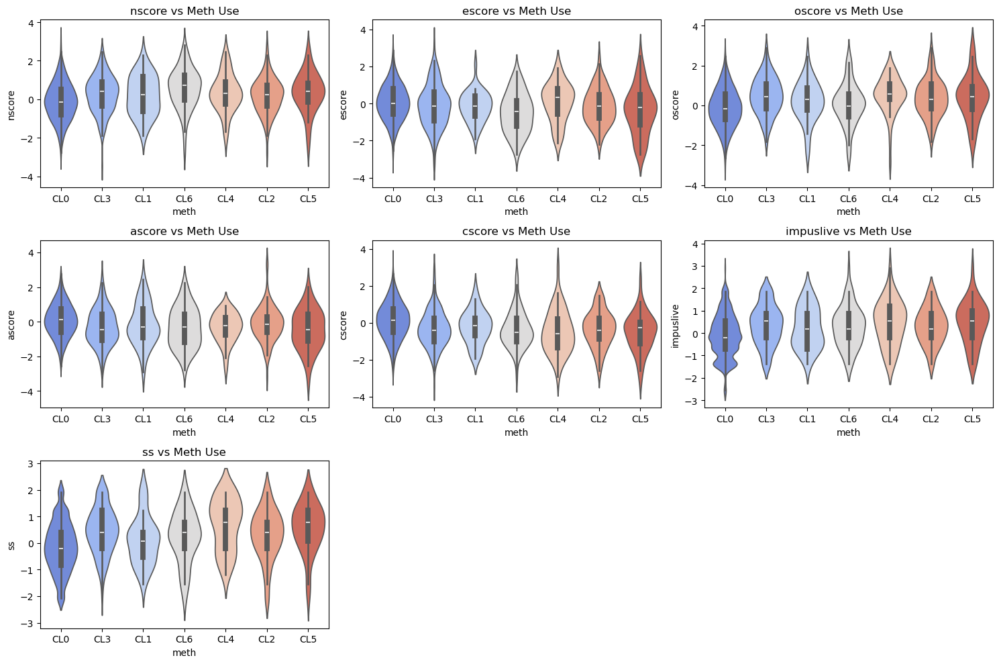

In [264]:
plt.figure(figsize=(15, 10))
num_vars = len(trait_scores)
num_cols = 3
num_rows = 3

for i, feature in enumerate(trait_scores):
    plt.subplot(num_rows, num_cols, i + 1)  
    sns.violinplot(x=df['meth'], y=df[feature], palette="coolwarm")
    plt.title(f"{feature} vs Meth Use")

plt.tight_layout()
plt.show()

# Data Binning for further EDA

In [217]:

age_map = {
    -0.95197: "18-24",
    -0.07854: "25-34",
    0.49788: "35-44",
    1.09449: "45-54",
    1.82213: "55-64",
    2.59171: "65+"
}

gender_map = {
    0.48246: "Female",
    -0.48246: "Male"
}

education_map = {
    -2.43591: "Left school before 16 years",
    -1.73790: "Left school at 16 years",
    -1.43719: "Left school at 17 years",
    -1.22751: "Left school at 18 years",
    -0.61113: "Some college or university, no certificate or degree",
    -0.05921: "Professional certificate/diploma",
    0.45468: "University degree",
    1.16365: "Masters degree",
    1.98437: "Doctorate degree"
}

country_map = {
    -0.09765: "Australia",
    0.24923: "Canada",
    -0.46841: "New Zealand",
    -0.28519: "Other",
    0.21128: "Republic of Ireland",
    0.96082: "UK",
    -0.57009: "USA"
}

ethnicity_map = {
    -0.50212: "Asian",
    -1.10702: "Black",
    1.90725: "Mixed-Black/Asian",
    0.12600: "Mixed-White/Asian",
    -0.22166: "Mixed-White/Black",
    0.11440: "Other",
    -0.31685: "White"
}

# Creating thek new DataFrame with categorical values
df_categorical = df.copy()
df_categorical["age"] = df["age"].replace(age_map)
df_categorical["gender"] = df["gender"].replace(gender_map)
df_categorical["education"] = df["education"].replace(education_map)
df_categorical["country"] = df["country"].replace(country_map)
df_categorical["ethnicity"] = df["ethnicity"].replace(ethnicity_map)
df_categorical

,age,gender,education,country,ethnicity,nscore,escore,oscore,ascore,cscore,...,ecstasy,heroin,ketamine,legalh,lsd,meth,mushrooms,nicotine,semer,vsa
0,35-44,Female,Professional certificate/diploma,UK,Mixed-White/Asian,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,...,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL2,CL0,CL0
1,25-34,Male,Doctorate degree,UK,White,-0.67825,1.93886,1.43533,0.76096,-0.14277,...,CL4,CL0,CL2,CL0,CL2,CL3,CL0,CL4,CL0,CL0
2,35-44,Male,Professional certificate/diploma,UK,White,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,...,CL0,CL0,CL0,CL0,CL0,CL0,CL1,CL0,CL0,CL0
3,18-24,Female,Masters degree,UK,White,-0.14882,-0.80615,-0.01928,0.59042,0.58489,...,CL0,CL0,CL2,CL0,CL0,CL0,CL0,CL2,CL0,CL0
4,35-44,Female,Doctorate degree,UK,White,0.73545,-1.63340,-0.45174,-0.30172,1.30612,...,CL1,CL0,CL0,CL1,CL0,CL0,CL2,CL2,CL0,CL0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1880,18-24,Female,"Some college or university, no certificate or ...",USA,White,-1.19430,1.74091,1.88511,0.76096,-1.13788,...,CL0,CL0,CL0,CL3,CL3,CL0,CL0,CL0,CL0,CL5
1881,18-24,Male,"Some college or university, no certificate or ...",USA,White,-0.24649,1.74091,0.58331,0.76096,-1.51840,...,CL2,CL0,CL0,CL3,CL5,CL4,CL4,CL5,CL0,CL0
1882,25-34,Female,University degree,USA,White,1.13281,-1.37639,-1.27553,-1.77200,-1.38502,...,CL4,CL0,CL2,CL0,CL2,CL0,CL2,CL6,CL0,CL0
1883,18-24,Female,"Some college or university, no certificate or ...",USA,White,0.91093,-1.92173,0.29338,-1.62090,-2.57309,...,CL3,CL0,CL0,CL3,CL3,CL0,CL3,CL4,CL0,CL0


# Personality Scores by Categories

In [222]:
substances_to_plot = df_target.columns.to_list()

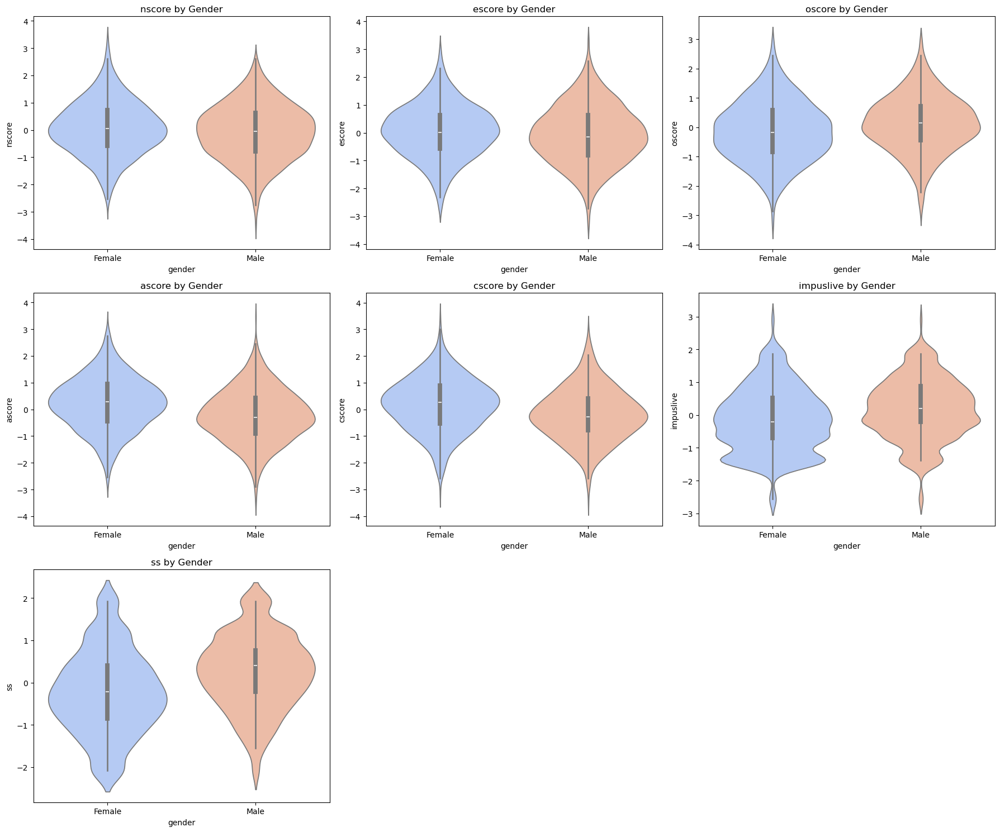

In [228]:
num_traits = len(trait_scores)
cols = 3 
rows = 3  

fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows)) 
axes = axes.flatten() 

for i, col in enumerate(trait_scores):
    sns.violinplot(data=df_categorical, x="gender", y=col, palette="coolwarm", ax=axes[i])
    axes[i].set_title(f"{col} by Gender")

for j in range(len(trait_scores), len(axes)):  
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


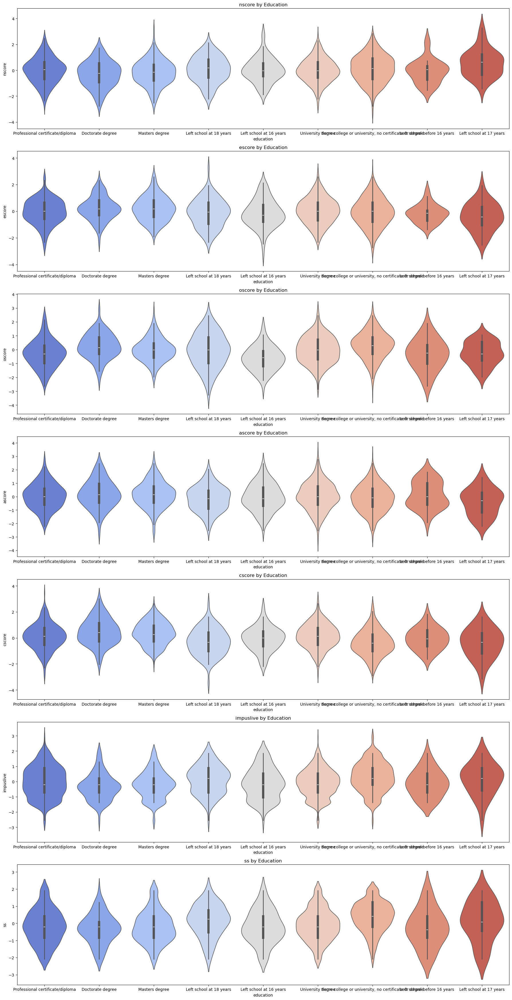

In [230]:
num_traits = len(trait_scores)
cols = 1 
rows = 7

fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows)) 
axes = axes.flatten() 

for i, col in enumerate(trait_scores):
    sns.violinplot(data=df_categorical, x="education", y=col, palette="coolwarm", ax=axes[i])
    axes[i].set_title(f"{col} by Education")

for j in range(len(trait_scores), len(axes)):  
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

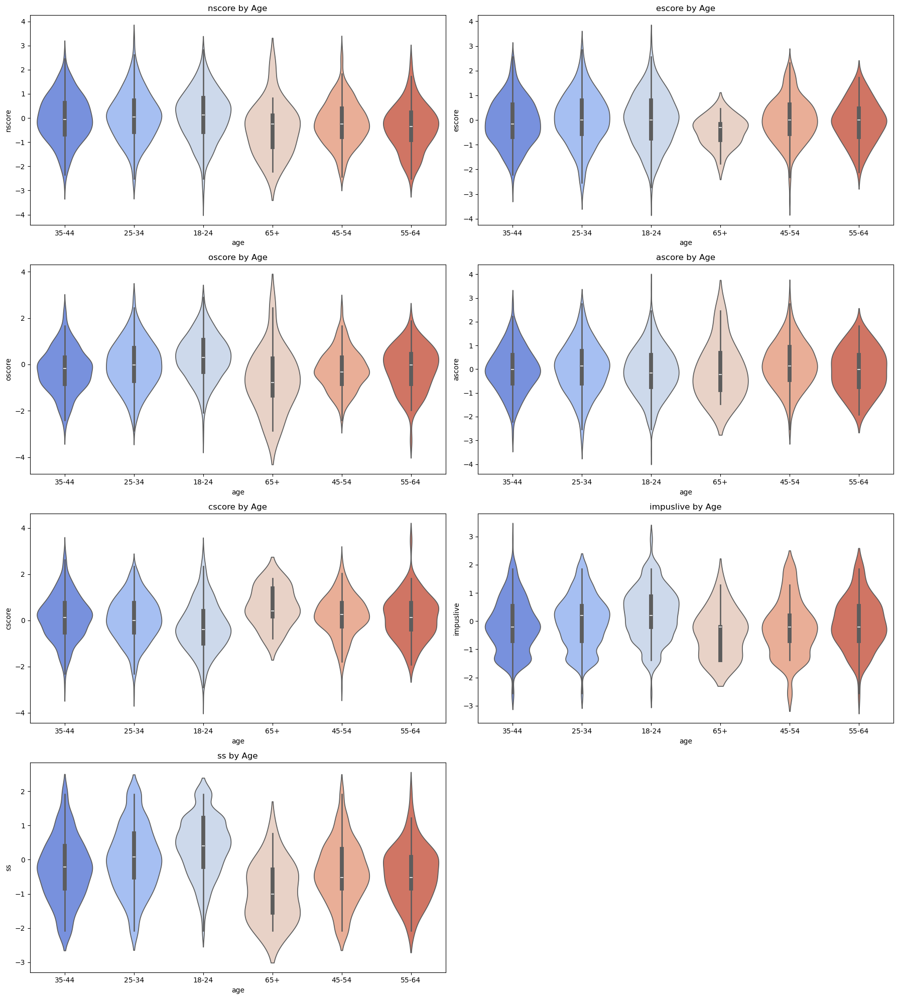

In [232]:
num_traits = len(trait_scores)
cols = 2 
rows = 4

fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows)) 
axes = axes.flatten() 

for i, col in enumerate(trait_scores):
    sns.violinplot(data=df_categorical, x="age", y=col, palette="coolwarm", ax=axes[i])
    axes[i].set_title(f"{col} by Age")

for j in range(len(trait_scores), len(axes)):  
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

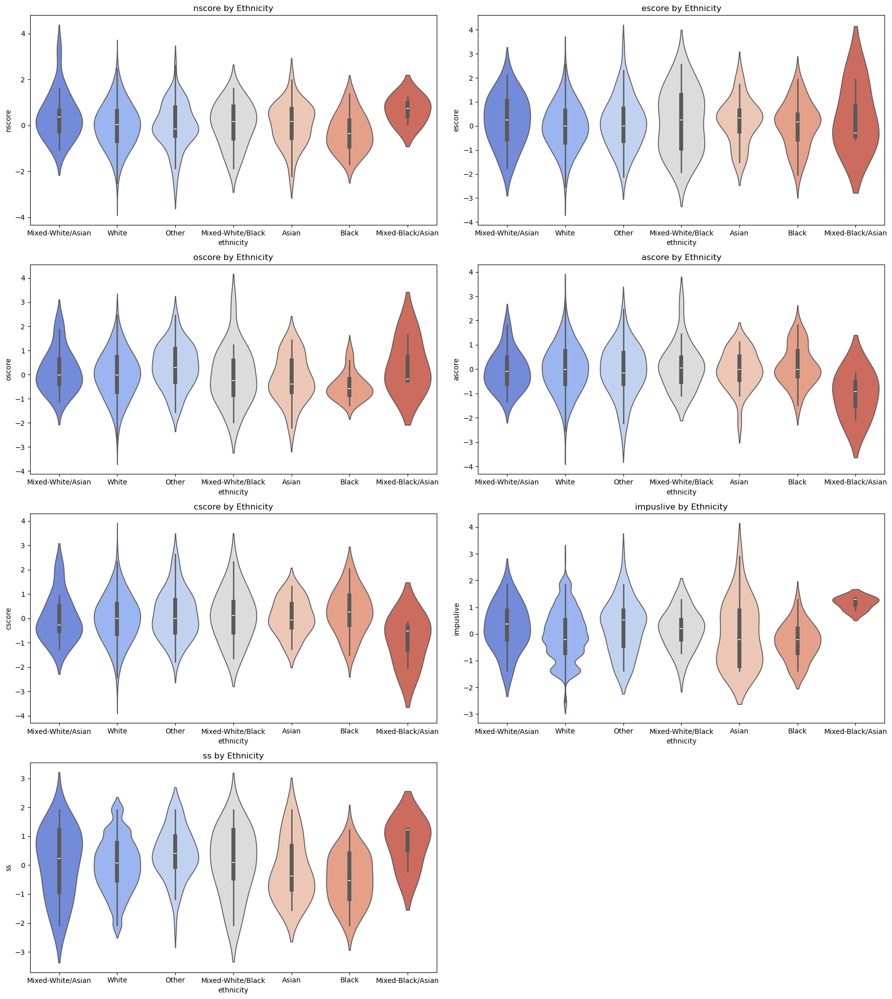

In [234]:
num_traits = len(trait_scores)
cols = 2
rows = 4 

fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows)) 
axes = axes.flatten() 

for i, col in enumerate(trait_scores):
    sns.violinplot(data=df_categorical, x="ethnicity", y=col, palette="coolwarm", ax=axes[i])
    axes[i].set_title(f"{col} by Ethnicity")

for j in range(len(trait_scores), len(axes)):  
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# Distribution of Users

## Age

C:\Users\sardo\AppData\Local\Temp\ipykernel_10924\2079606886.py:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x="age", hue=substance, fill=True, ax=axes[i])


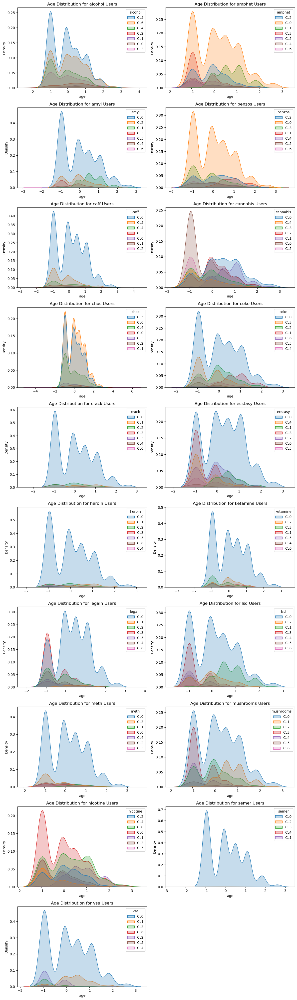

In [155]:

num_substances = len(substances_to_plot)
ncols = 2  
nrows = 10

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 4 * nrows))
axes = axes.flatten()

# Plot for each substance
for i, substance in enumerate(substances_to_plot):
    sns.kdeplot(data=df, x="age", hue=substance, fill=True, ax=axes[i])
    axes[i].set_title(f"Age Distribution for {substance} Users")

# Hide unused axes if there are fewer substances than axes
for j in range(num_substances, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


## Traits

In [157]:
trait_scores

['nscore',
 'escore',
 'oscore',
 'ascore',
 'cscore',
 'impulsiveness',
 'SensationSeeking']

C:\Users\sardo\AppData\Local\Temp\ipykernel_10924\1534741457.py:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x="nscore", hue=substance, fill=True, ax=axes[i])


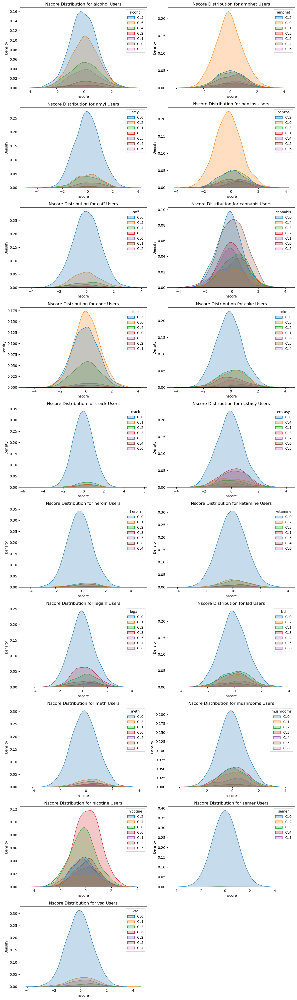

In [163]:
num_substances = len(substances_to_plot)
ncols = 2  
nrows = 10

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 4 * nrows))
axes = axes.flatten()

# Plot for each substance
for i, substance in enumerate(substances_to_plot):
    sns.kdeplot(data=df, x="nscore", hue=substance, fill=True, ax=axes[i])
    axes[i].set_title(f"Nscore Distribution for {substance} Users")

# Hide unused axes if there are fewer substances than axes
for j in range(num_substances, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

C:\Users\sardo\AppData\Local\Temp\ipykernel_10924\3745594470.py:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x="escore", hue=substance, fill=True, ax=axes[i])


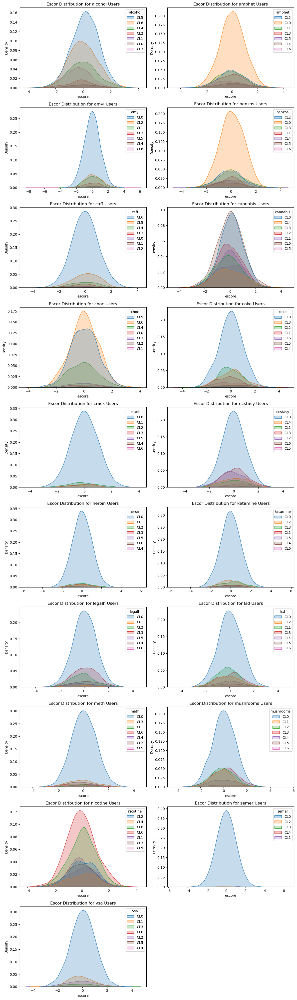

In [164]:
num_substances = len(substances_to_plot)
ncols = 2  
nrows = 10

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 4 * nrows))
axes = axes.flatten()

# Plot for each substance
for i, substance in enumerate(substances_to_plot):
    sns.kdeplot(data=df, x="escore", hue=substance, fill=True, ax=axes[i])
    axes[i].set_title(f"Escor Distribution for {substance} Users")

# Hide unused axes if there are fewer substances than axes
for j in range(num_substances, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

C:\Users\sardo\AppData\Local\Temp\ipykernel_10924\3269361318.py:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x="ascore", hue=substance, fill=True, ax=axes[i])


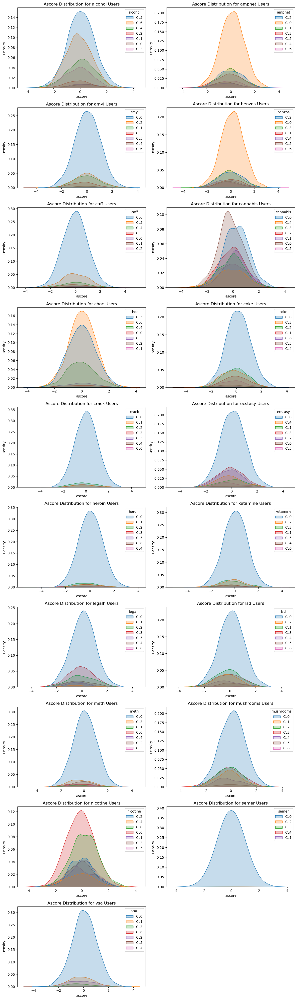

In [170]:
num_substances = len(substances_to_plot)
ncols = 2  
nrows = 10

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 4 * nrows))
axes = axes.flatten()

# Plot for each substance
for i, substance in enumerate(substances_to_plot):
    sns.kdeplot(data=df, x="ascore", hue=substance, fill=True, ax=axes[i])
    axes[i].set_title(f"Ascore Distribution for {substance} Users")

# Hide unused axes if there are fewer substances than axes
for j in range(num_substances, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

C:\Users\sardo\AppData\Local\Temp\ipykernel_10924\1032795700.py:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x="cscore", hue=substance, fill=True, ax=axes[i])


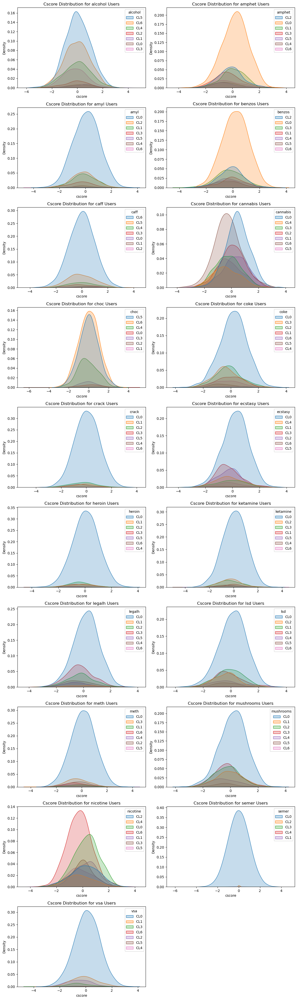

In [172]:
num_substances = len(substances_to_plot)
ncols = 2  
nrows = 10

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 4 * nrows))
axes = axes.flatten()

# Plot for each substance
for i, substance in enumerate(substances_to_plot):
    sns.kdeplot(data=df, x="cscore", hue=substance, fill=True, ax=axes[i])
    axes[i].set_title(f"Cscore Distribution for {substance} Users")

# Hide unused axes if there are fewer substances than axes
for j in range(num_substances, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

C:\Users\sardo\AppData\Local\Temp\ipykernel_10924\3098799286.py:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x="impuslive", hue=substance, fill=True, ax=axes[i])


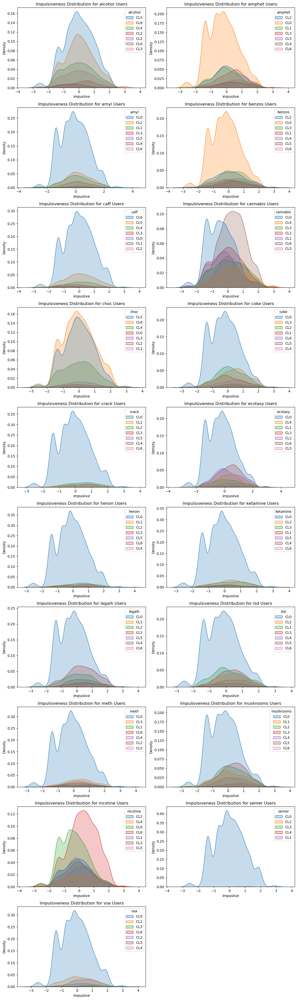

In [248]:
num_substances = len(substances_to_plot)
ncols = 2  
nrows = 10

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 4 * nrows))
axes = axes.flatten()

# Plot for each substance
for i, substance in enumerate(substances_to_plot):
    sns.kdeplot(data=df, x="impuslive", hue=substance, fill=True, ax=axes[i])
    axes[i].set_title(f"Impulsiveness Distribution for {substance} Users")

# Hide unused axes if there are fewer substances than axes
for j in range(num_substances, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

C:\Users\sardo\AppData\Local\Temp\ipykernel_10924\3317279556.py:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x="ss", hue=substance, fill=True, ax=axes[i])
C:\Users\sardo\AppData\Local\Temp\ipykernel_10924\3317279556.py:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x="ss", hue=substance, fill=True, ax=axes[i])


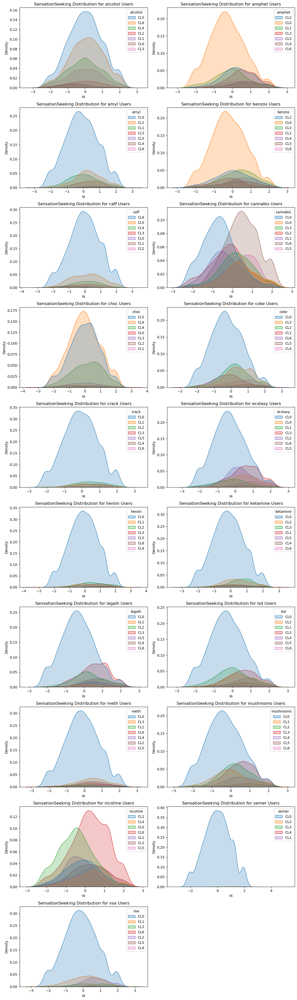

In [250]:
num_substances = len(substances_to_plot)
ncols = 2  
nrows = 10

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 4 * nrows))
axes = axes.flatten()

# Plot for each substance
for i, substance in enumerate(substances_to_plot):
    sns.kdeplot(data=df, x="ss", hue=substance, fill=True, ax=axes[i])
    axes[i].set_title(f"SensationSeeking Distribution for {substance} Users")

# Hide unused axes if there are fewer substances than axes
for j in range(num_substances, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

# EDA Target Encoding

In [31]:
drugs = df_target.columns.to_list()

In [33]:
def drug_encoder(x):
    if x == 'CL0':
        return 0
    elif x == 'CL1':
        return 1
    elif x == 'CL2':
        return 2
    elif x == 'CL3':
        return 3
    elif x == 'CL4':
        return 4
    elif x == 'CL5':
        return 5
    elif x == 'CL6':
        return 6
    else:
        return 7
for column in drugs:
    df[column] = df[column].apply(drug_encoder)

In [35]:
df

,age,gender,education,country,ethnicity,nscore,escore,oscore,ascore,cscore,...,ecstasy,heroin,ketamine,legalh,lsd,meth,mushrooms,nicotine,semer,vsa
0,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,...,0,0,0,0,0,0,0,2,0,0
1,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,...,4,0,2,0,2,3,0,4,0,0
2,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,...,0,0,0,0,0,0,1,0,0,0
3,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,0.58489,...,0,0,2,0,0,0,0,2,0,0
4,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,1.30612,...,1,0,0,1,0,0,2,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1880,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,-1.19430,1.74091,1.88511,0.76096,-1.13788,...,0,0,0,3,3,0,0,0,0,5
1881,-0.95197,-0.48246,-0.61113,-0.57009,-0.31685,-0.24649,1.74091,0.58331,0.76096,-1.51840,...,2,0,0,3,5,4,4,5,0,0
1882,-0.07854,0.48246,0.45468,-0.57009,-0.31685,1.13281,-1.37639,-1.27553,-1.77200,-1.38502,...,4,0,2,0,2,0,2,6,0,0
1883,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,0.91093,-1.92173,0.29338,-1.62090,-2.57309,...,3,0,0,3,3,0,3,4,0,0


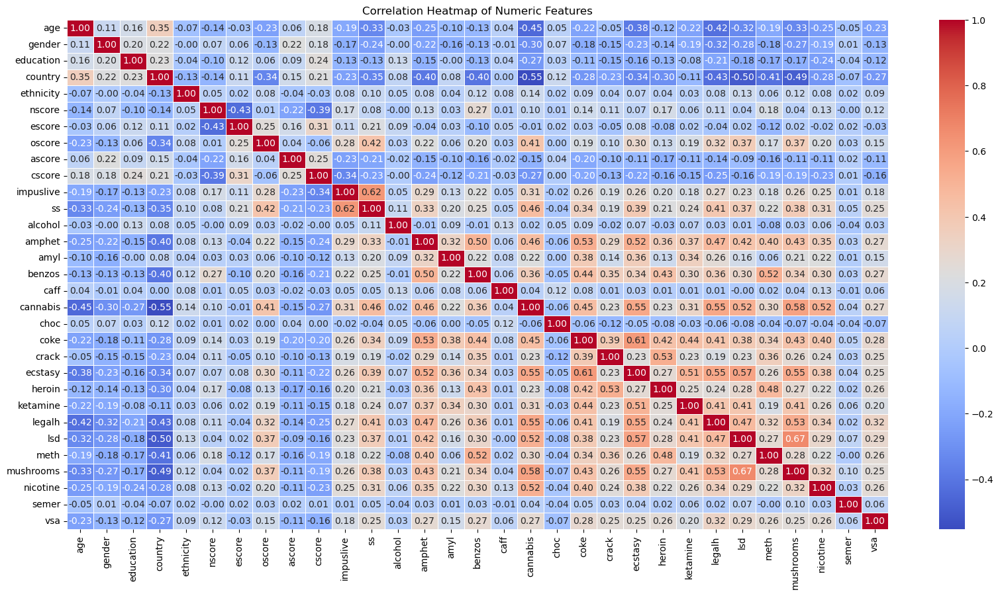

In [84]:
correlation_matrix = df.corr(method='pearson')

# Plotting the correlation heatmap
plt.figure(figsize=(20, 10))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap of Numeric Features")
plt.show()

In [37]:
df

,age,gender,education,country,ethnicity,nscore,escore,oscore,ascore,cscore,...,ecstasy,heroin,ketamine,legalh,lsd,meth,mushrooms,nicotine,semer,vsa
0,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,...,0,0,0,0,0,0,0,2,0,0
1,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,...,4,0,2,0,2,3,0,4,0,0
2,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,...,0,0,0,0,0,0,1,0,0,0
3,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,0.58489,...,0,0,2,0,0,0,0,2,0,0
4,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,1.30612,...,1,0,0,1,0,0,2,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1880,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,-1.19430,1.74091,1.88511,0.76096,-1.13788,...,0,0,0,3,3,0,0,0,0,5
1881,-0.95197,-0.48246,-0.61113,-0.57009,-0.31685,-0.24649,1.74091,0.58331,0.76096,-1.51840,...,2,0,0,3,5,4,4,5,0,0
1882,-0.07854,0.48246,0.45468,-0.57009,-0.31685,1.13281,-1.37639,-1.27553,-1.77200,-1.38502,...,4,0,2,0,2,0,2,6,0,0
1883,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,0.91093,-1.92173,0.29338,-1.62090,-2.57309,...,3,0,0,3,3,0,3,4,0,0


In [55]:
responses = ["alcohol", "cannabis", "coke", "crack", "ecstasy", "heroin", "meth", "nicotine"]

In [90]:
covariates =  df.columns.drop(drugs).tolist()

In [92]:
covariates

['age',
 'gender',
 'education',
 'country',
 'ethnicity',
 'nscore',
 'escore',
 'oscore',
 'ascore',
 'cscore',
 'impuslive',
 'ss']

In [61]:
import numpy as np
import statsmodels.api as sm
from itertools import chain, combinations
# Function to generate all possible subsets of covariates
def subsets(iterable):
    s = list(iterable)
    return chain.from_iterable(combinations(s, r) for r in range(1, len(s) + 1))


best_formulas = {}


for response in responses:
    formulas = [f"{response} ~ {' + '.join(subset)}" for subset in subsets(covariates)]
    BICs = []
    for formula in formulas:
        model_covariates = formula.split(' ~ ')[1].split(' + ') if ' + ' in formula else [formula.split(' ~ ')[1]]
        
        X = df[model_covariates]
        X = sm.add_constant(X) 
        y = df[response]
        
        model = sm.OLS(y, X).fit()
        BICs.append(model.bic)
    
    best_formulas[response] = formulas[np.argmin(BICs)]


for drug, best_formula in best_formulas.items():
    print(f"Best model for {drug}: {best_formula}")

Best model for alcohol: alcohol ~ education + country + ss
Best model for cannabis: cannabis ~ age + gender + education + country + ethnicity + oscore + cscore + ss
Best model for coke: coke ~ age + gender + country + nscore + ascore + ss
Best model for crack: crack ~ age + gender + education + country + nscore + impuslive
Best model for ecstasy: ecstasy ~ age + gender + country + escore + oscore + cscore + ss
Best model for heroin: heroin ~ country + nscore + ascore + ss
Best model for meth: meth ~ gender + country + nscore + ss
Best model for nicotine: nicotine ~ age + gender + education + country + oscore + cscore + ss


## AIC

In [65]:
import statsmodels.formula.api as smf

responses = ["alcohol", "cannabis", "coke", "crack", "ecstasy", "heroin", "meth"]

covariates = df.columns.drop(responses).tolist()

def criterion(formula, df):
    """
    Calculate the AIC for a given regression model formula and dataframe.
    """
    model = smf.ols(formula, df).fit()
    return model.aic 

def remove(df, already_selected_columns, criterion, response):
    """
    Identify the worst column to remove based on the given criterion.
    """
    worst_criterion = float('inf') 
    worst_column = None

    for column in already_selected_columns:
        new_columns = already_selected_columns - {column}
        formula = f'{response} ~ {" + ".join(new_columns)}'
        current_criterion = criterion(formula, df)
        
        if current_criterion < worst_criterion:
            worst_criterion = current_criterion
            worst_column = column
    
    return worst_column, worst_criterion

def backward(df, criterion, response):
    """
    Perform backward selection to find the optimal model based on the given criterion.
    """
    already_selected_columns = set(df.columns.drop(response))  
    best_criterion = criterion(f'{response} ~ {" + ".join(already_selected_columns)}', df)
    
    while len(already_selected_columns) > 0:
        potential_column, current_criterion = remove(df, already_selected_columns, criterion, response)

        if current_criterion <= best_criterion:
            already_selected_columns.remove(potential_column) 
            best_criterion = current_criterion
        else:
            break

    return already_selected_columns
best_feature_sets = {}
for drug in responses:
    best_feature_sets[drug] = backward(df, criterion, drug)
for drug, features in best_feature_sets.items():
    print(f"Best features for {drug}: {', '.join(features)}")


Best features for alcohol: amphet, ss, caff, ecstasy, education, coke, nicotine, semer, meth, country, ethnicity
Best features for cannabis: nscore, ss, ecstasy, cscore, education, coke, ketamine, oscore, heroin, nicotine, mushrooms, age, legalh, gender, escore, country, ethnicity, amyl
Best features for coke: amphet, nscore, ascore, ecstasy, education, crack, ketamine, benzos, oscore, heroin, nicotine, vsa, mushrooms, age, alcohol, lsd, gender, cannabis, escore, meth, amyl
Best features for crack: choc, ascore, ecstasy, education, coke, ketamine, benzos, heroin, nicotine, vsa, mushrooms, age, legalh, gender, impuslive, meth
Best features for ecstasy: amphet, ascore, cscore, crack, coke, ketamine, heroin, vsa, mushrooms, age, lsd, legalh, cannabis, escore, country, ethnicity, amyl
Best features for heroin: amphet, nscore, ascore, ecstasy, crack, coke, ketamine, benzos, vsa, lsd, cannabis, meth, country
Best features for meth: amphet, choc, crack, benzos, heroin, vsa, age, alcohol, lsd,

## BIC

In [74]:
import statsmodels.formula.api as smf

responses = ["alcohol", "cannabis", "coke", "crack", "ecstasy", "heroin", "meth"]

covariates = df.columns.drop(responses).tolist()

def criterion(formula, df):
    """
    Calculate the BIC for a given regression model formula and dataframe.
    """
    model = smf.ols(formula, df).fit()
    return model.bic

def remove(df, already_selected_columns, criterion, response):
    """
    Identify the worst column to remove based on the given criterion.
    """
    worst_criterion = float('inf') 
    worst_column = None

    for column in already_selected_columns:
        new_columns = already_selected_columns - {column}
        formula = f'{response} ~ {" + ".join(new_columns)}'
        current_criterion = criterion(formula, df)
        
        if current_criterion < worst_criterion:
            worst_criterion = current_criterion
            worst_column = column
    
    return worst_column, worst_criterion

def backward(df, criterion, response):
    """
    Perform backward selection to find the optimal model based on the given criterion.
    """
    already_selected_columns = set(df.columns.drop(response))  
    best_criterion = criterion(f'{response} ~ {" + ".join(already_selected_columns)}', df)
    
    while len(already_selected_columns) > 0:
        potential_column, current_criterion = remove(df, already_selected_columns, criterion, response)

        if current_criterion <= best_criterion:
            already_selected_columns.remove(potential_column) 
            best_criterion = current_criterion
        else:
            break

    return already_selected_columns
best_feature_sets = {}
for drug in responses:
    best_feature_sets[drug] = backward(df, criterion, drug)
for drug, features in best_feature_sets.items():
    print(f"Best features for {drug}: {', '.join(features)}")

Best features for alcohol: ss, caff, education, coke, meth, country
Best features for cannabis: ss, ecstasy, education, coke, oscore, heroin, nicotine, mushrooms, age, legalh, gender, escore, country
Best features for coke: amphet, ascore, ecstasy, crack, ketamine, benzos, heroin, nicotine, alcohol, amyl
Best features for crack: choc, education, coke, heroin, vsa, mushrooms, age, meth
Best features for ecstasy: amphet, coke, ketamine, heroin, age, lsd, legalh, cannabis, escore, amyl
Best features for heroin: ascore, crack, coke, benzos, lsd, cannabis, meth
Best features for meth: amphet, crack, benzos, heroin, alcohol, legalh, country, amyl


# LASSO

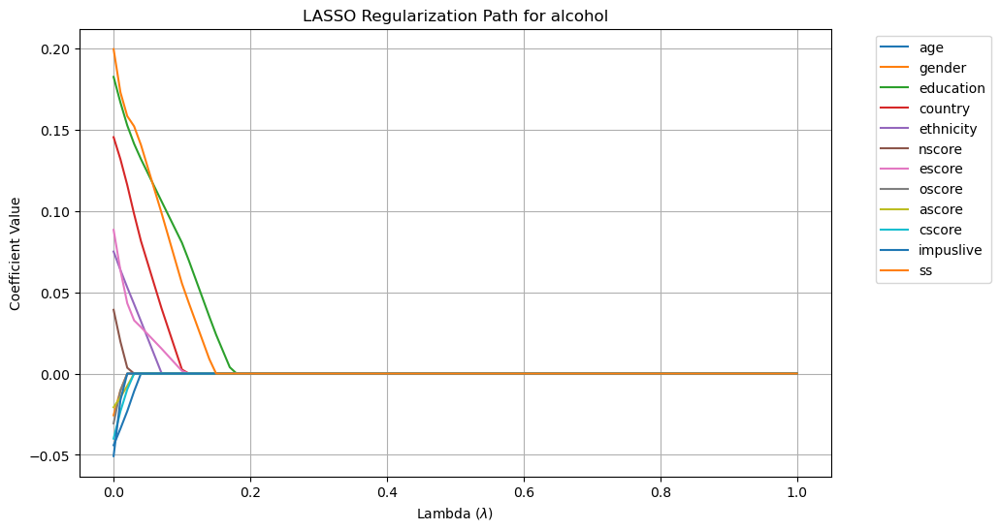

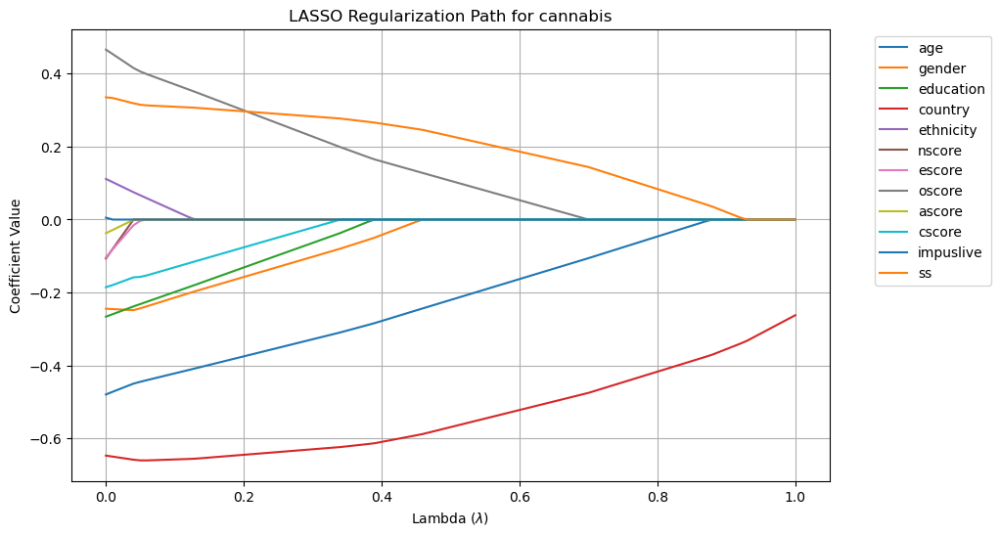

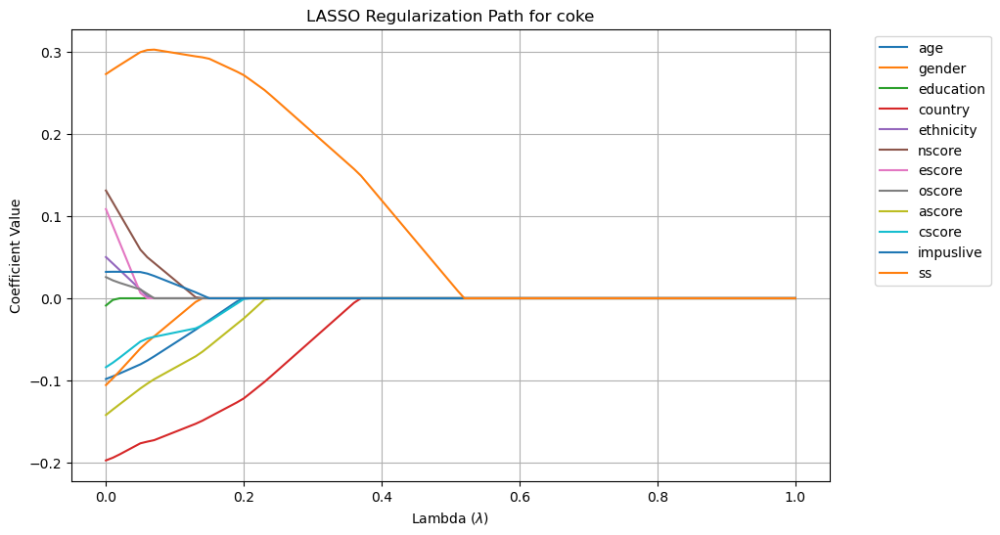

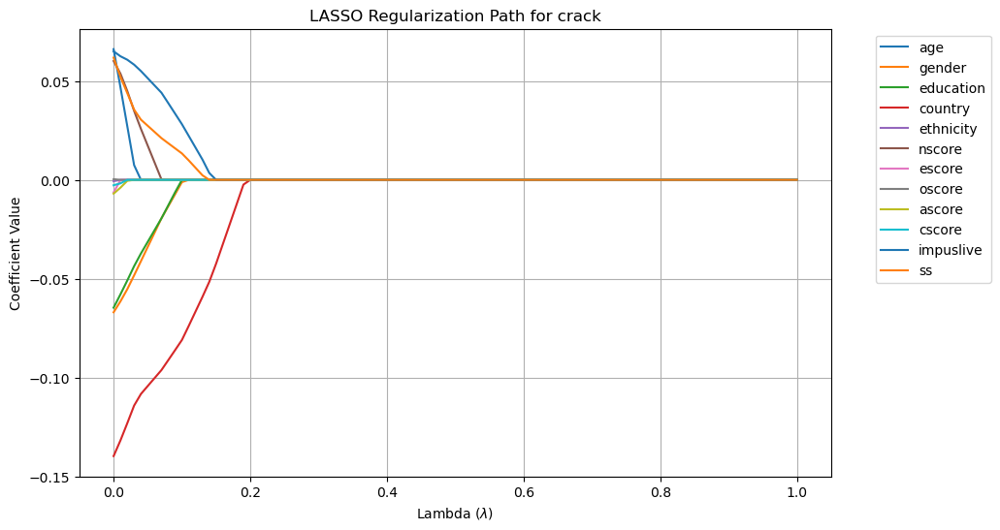

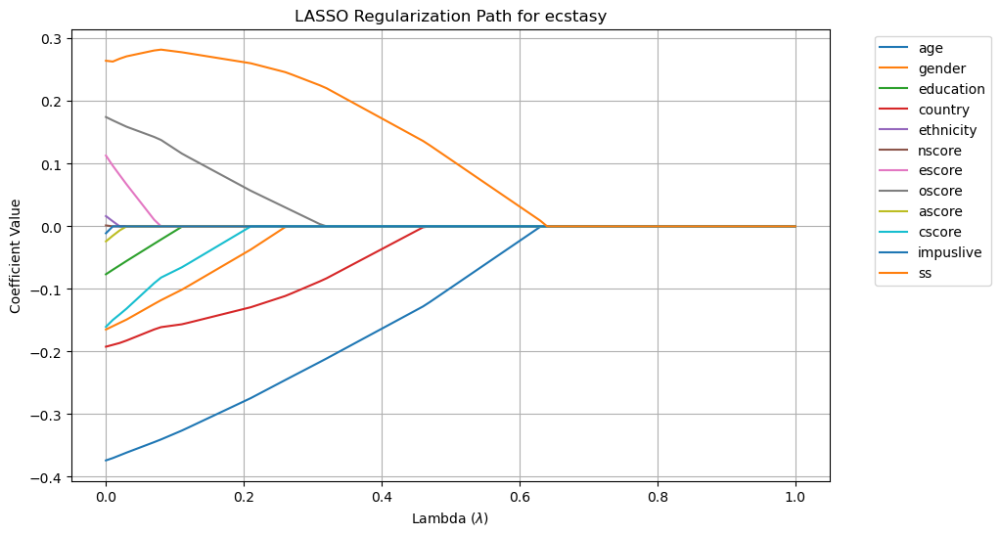

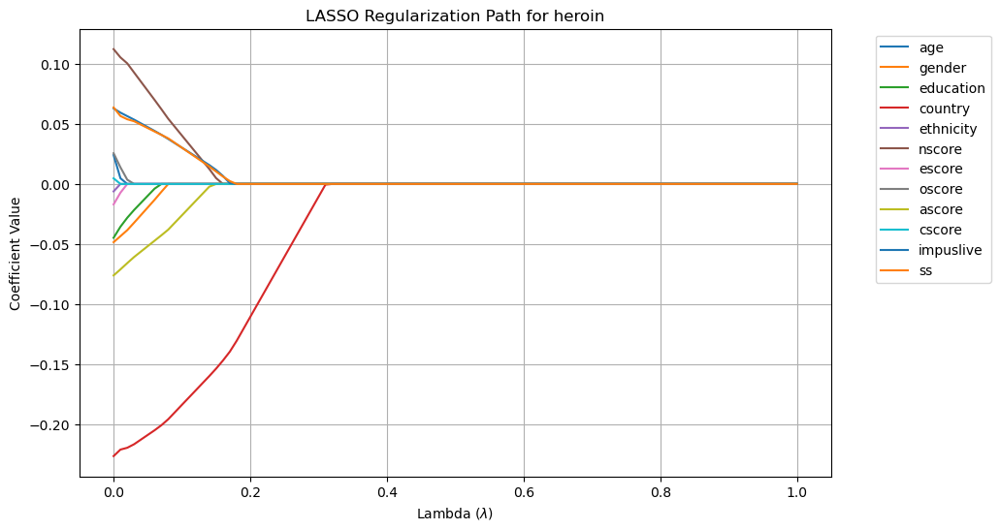

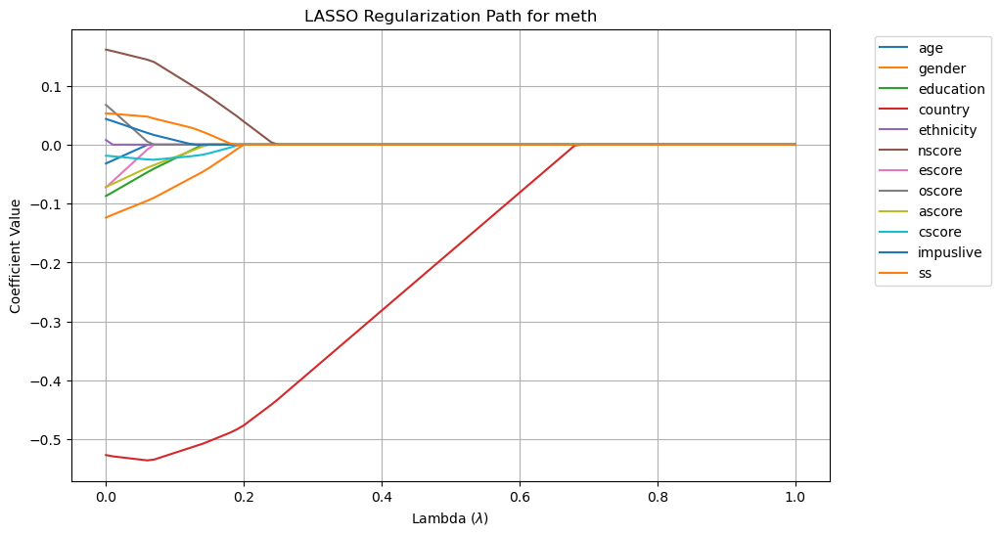

In [94]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[covariates])
lambdas = np.arange(0, 1.01, 0.01)
coefficients_dict = {}
for response in responses:
    y = df[response]  

    coefficients = []

    for lambda_val in lambdas:
        if lambda_val == 0:
            model = LinearRegression()
            model.fit(X_scaled, y)
            coefficients.append(model.coef_)
        else:
            lasso = Lasso(alpha=lambda_val, max_iter=10000)
            lasso.fit(X_scaled, y)
            coefficients.append(lasso.coef_)

    coefficients = np.array(coefficients)
    coefficients_dict[response] = coefficients  
    plt.figure(figsize=(10, 6))
    for i in range(coefficients.shape[1]):
        plt.plot(lambdas, coefficients[:, i], label=covariates[i])

    plt.xlabel(r'Lambda ($\lambda$)')
    plt.ylabel('Coefficient Value')
    plt.title(f'LASSO Regularization Path for {response}')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.show()


In [96]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[covariates])
lambdas = np.logspace(-3, 1, 50)  
selected_covariates_dict = {}

for response in responses:
    y = df[response] 
    lasso_cv = LassoCV(alphas=lambdas, cv=5, max_iter=50000)
    lasso_cv.fit(X_scaled, y)
    optimal_lambda = lasso_cv.alpha_
    print(f"Optimal lambda for {response}: {optimal_lambda}")
    final_lasso = Lasso(alpha=optimal_lambda, max_iter=50000)
    final_lasso.fit(X_scaled, y)
    selected_covariates = np.array(covariates)[final_lasso.coef_ != 0]
    selected_covariates_dict[response] = selected_covariates  # Store results
    print(f"Selected covariates for {response}:")
    print(selected_covariates)
    print("Coefficients of selected covariates:")
    for covariate, coefficient in zip(selected_covariates, final_lasso.coef_[final_lasso.coef_ != 0]):
        print(f"{covariate}: {coefficient}")
    print("\n" + "="*50 + "\n")


Optimal lambda for alcohol: 0.020235896477251564
Selected covariates for alcohol:
['age' 'education' 'country' 'ethnicity' 'nscore' 'escore' 'ascore'
 'cscore' 'ss']
Coefficients of selected covariates:
age: -0.022815958003672525
education: 0.15222996609032377
country: 0.11542652091703423
ethnicity: 0.05269685788955793
nscore: 0.0032591537943452565
escore: 0.04286889000180246
ascore: -0.0073795862950576325
cscore: -0.009454356927905349
ss: 0.15812984110542558


Optimal lambda for cannabis: 0.001
Selected covariates for cannabis:
['age' 'gender' 'education' 'country' 'ethnicity' 'nscore' 'escore'
 'oscore' 'ascore' 'cscore' 'impuslive' 'ss']
Coefficients of selected covariates:
age: -0.4787299283175527
gender: -0.2444674595546073
education: -0.26545820314256996
country: -0.6472024555552862
ethnicity: 0.11056635174181031
nscore: -0.10413374851211832
escore: -0.10147398458415369
oscore: 0.4645653262007955
ascore: -0.03636804570099796
cscore: -0.18478666650392442
impuslive: 0.0044083568538

In [98]:
ols_summaries = {}

for response in responses:
    selected_covariates = selected_covariates_dict.get(response, [])
    if len(selected_covariates) == 0:
        print(f"No covariates selected for {response}. Skipping OLS model.\n")
        continue

    X_selected = df[selected_covariates]
    X_selected = sm.add_constant(X_selected) 
    y = df[response]
    model_selected = sm.OLS(y, X_selected).fit()

    ols_summaries[response] = model_selected.summary()
    print(f"\n{'='*30}\nOLS Summary for {response}:\n{'='*30}")
    print(model_selected.summary())


OLS Summary for alcohol:
                            OLS Regression Results                            
Dep. Variable:                alcohol   R-squared:                       0.049
Model:                            OLS   Adj. R-squared:                  0.044
Method:                 Least Squares   F-statistic:                     10.73
Date:                Sat, 08 Mar 2025   Prob (F-statistic):           2.22e-16
Time:                        16:33:06   Log-Likelihood:                -3166.2
No. Observations:                1885   AIC:                             6352.
Df Residuals:                    1875   BIC:                             6408.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.6969     

# Models

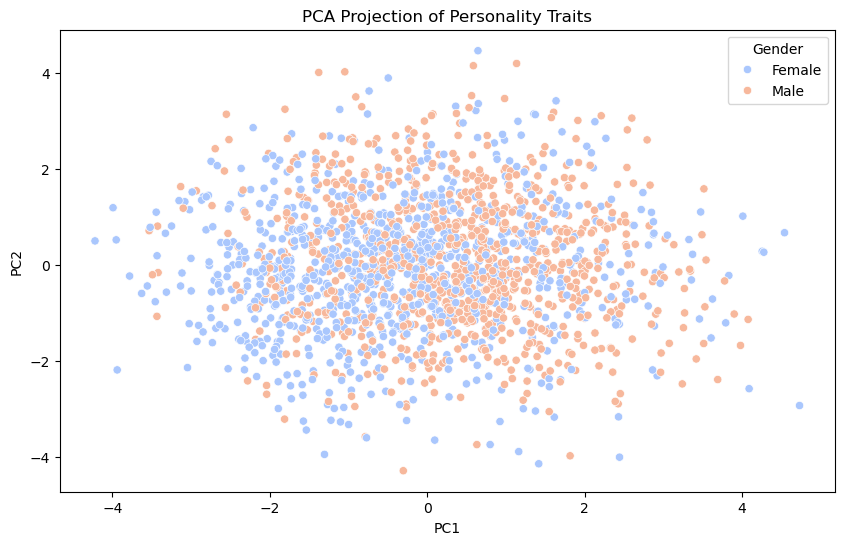

In [273]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_categorical[trait_scores])
df_categorical["PC1"], df_categorical["PC2"] = pca_result[:, 0], pca_result[:, 1]

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_categorical, x="PC1", y="PC2", hue="Gender", palette="coolwarm")
plt.title("PCA Projection of Personality Traits")
plt.show()

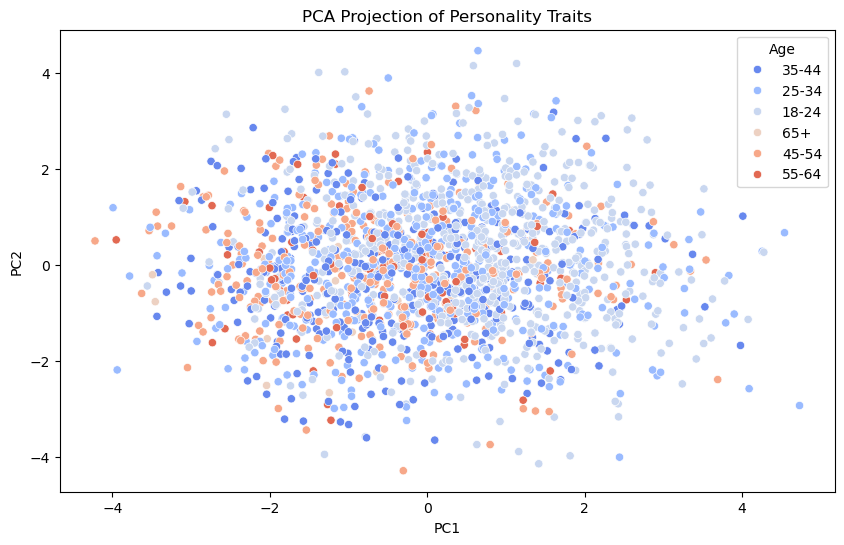

In [292]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_categorical[trait_scores])
df_categorical["PC1"], df_categorical["PC2"] = pca_result[:, 0], pca_result[:, 1]

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_categorical, x="PC1", y="PC2", hue="Age", palette="coolwarm")
plt.title("PCA Projection of Personality Traits")
plt.show()

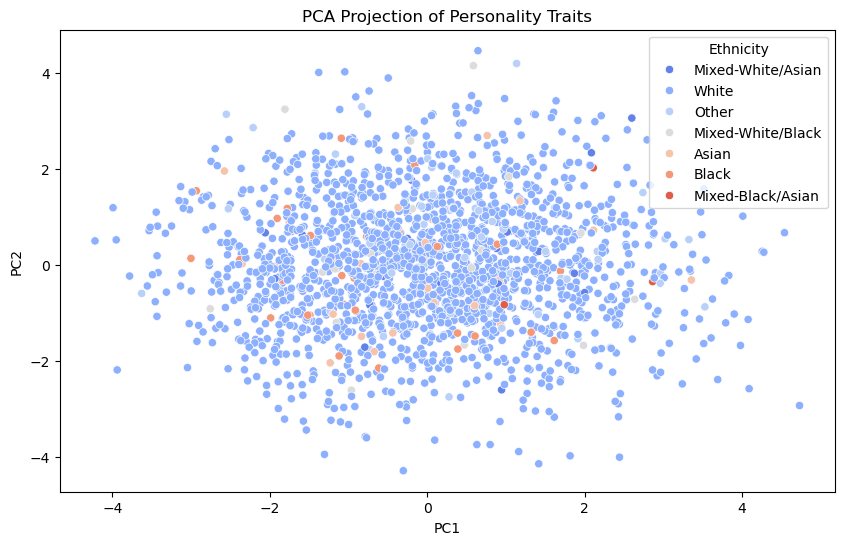

In [295]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_categorical[trait_scores])
df_categorical["PC1"], df_categorical["PC2"] = pca_result[:, 0], pca_result[:, 1]

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_categorical, x="PC1", y="PC2", hue="Ethnicity", palette="coolwarm")
plt.title("PCA Projection of Personality Traits")
plt.show()